<a href="https://colab.research.google.com/github/Jolanta27/AI-course/blob/master/Summary_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Problem:** Analiza wpływu inwestorów. Jak różni inwestorzy przyczyniają się do wzrostu wartości firm.

In [1]:
from google.colab import files
uploaded = files.upload()

Saving emergingunicorn_companies.csv to emergingunicorn_companies.csv


In [35]:
import pandas as pd

df = pd.read_csv("emergingunicorn_companies.csv")

df.head()

,Unnamed: 0,country,region,lead_investors,company_link,img_src,company_name,post_money_value,total_eq_funding
0,0,India,Asia,The Carlyle Group,https://www.crunchbase.com/organization/nxtra-...,https://images.crunchbase.com/image/upload/t_c...,Nxtra Data,$986M,$237M
1,1,United Kingdom,Europe,General Atlantic,https://www.crunchbase.com/organization/butter...,"data:image/gif;base64,R0lGODlhAQABAAAAACH5BAEK...",Butternut Box,$985M,$467M
2,2,India,Asia,Schroder Adveq,https://www.crunchbase.com/organization/bizongo,https://images.crunchbase.com/image/upload/t_c...,Bizongo,$980M,$290M
3,3,United States,North America,Sutter Hill Ventures,https://www.crunchbase.com/organization/augmen...,https://images.crunchbase.com/image/upload/t_c...,Augment,$977M,$252M
4,4,United States,North America,Lux Capital,https://www.crunchbase.com/organization/openstore,https://images.crunchbase.com/image/upload/t_c...,OpenStore,$970M,$137M


To solve this problem I will focus on columns like country, region, lead_investors, post_money_value, total_eq_funding and company_name. I don't need other columns to analysis, so I will remove them.


In [36]:
df = df.drop(columns=['Unnamed: 0', 'company_link', 'img_src'])
df.head(5)

,country,region,lead_investors,company_name,post_money_value,total_eq_funding
0,India,Asia,The Carlyle Group,Nxtra Data,$986M,$237M
1,United Kingdom,Europe,General Atlantic,Butternut Box,$985M,$467M
2,India,Asia,Schroder Adveq,Bizongo,$980M,$290M
3,United States,North America,Sutter Hill Ventures,Augment,$977M,$252M
4,United States,North America,Lux Capital,OpenStore,$970M,$137M


In [37]:
df.isnull().sum()

,0
country,0
region,0
lead_investors,14
company_name,0
post_money_value,0
total_eq_funding,0


In [38]:
def fill_missing_lead_investors(group):
    mode_value = group['lead_investors'].mode()
    if not mode_value.empty:
        group['lead_investors'] = group['lead_investors'].fillna(mode_value[0])
    else:
        group['lead_investors'] = group['lead_investors'].fillna('Unknown')
    return group

df = df.groupby(['country', 'region'], group_keys=False).apply(fill_missing_lead_investors)

print(df.isnull().sum())

country             0
region              0
lead_investors      0
company_name        0
post_money_value    0
total_eq_funding    0
dtype: int64


<ipython-input-38-51aabeb9b789>:9: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [39]:
df['post_money_value'] = df['post_money_value'].replace('[\$,M]', '', regex=True).astype(float)
df['total_eq_funding'] = df['total_eq_funding'].replace('[\$,M,B]', '', regex=True).astype(float)

df.head()

,country,region,lead_investors,company_name,post_money_value,total_eq_funding
0,India,Asia,The Carlyle Group,Nxtra Data,986.0,237.0
1,United Kingdom,Europe,General Atlantic,Butternut Box,985.0,467.0
2,India,Asia,Schroder Adveq,Bizongo,980.0,290.0
3,United States,North America,Sutter Hill Ventures,Augment,977.0,252.0
4,United States,North America,Lux Capital,OpenStore,970.0,137.0


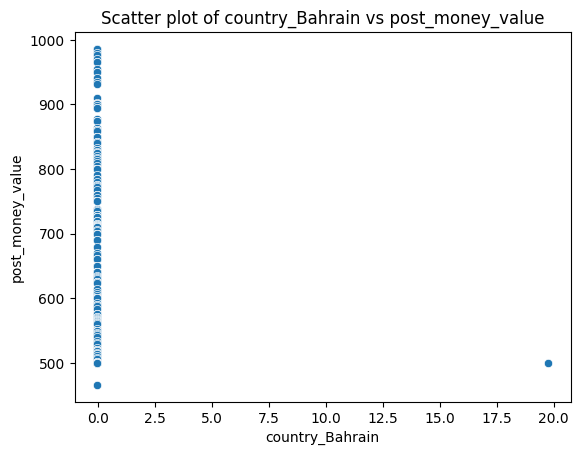

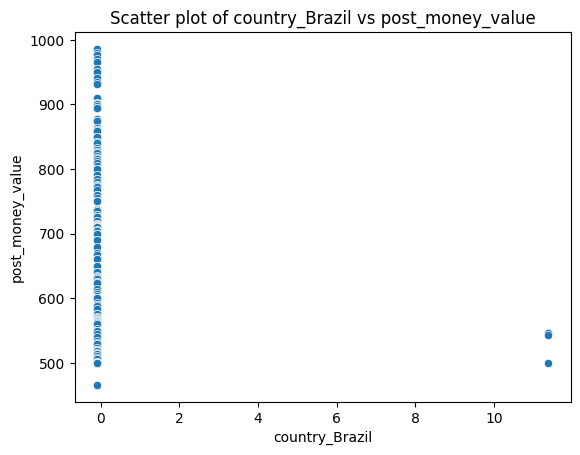

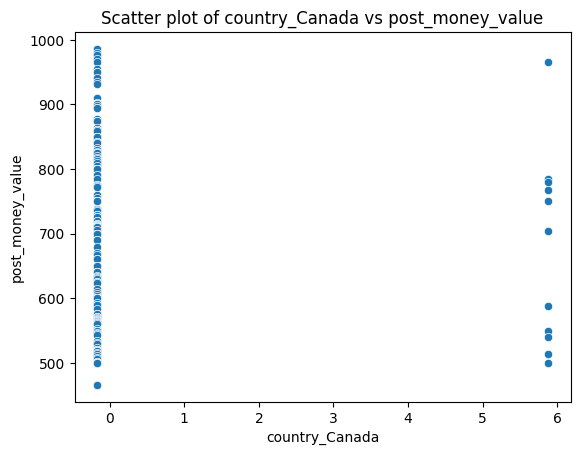

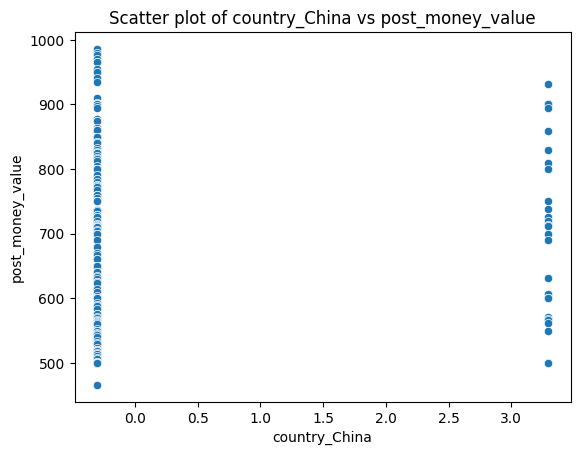

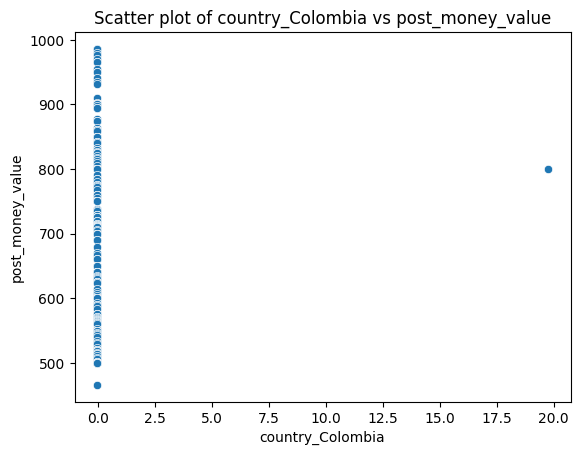

...

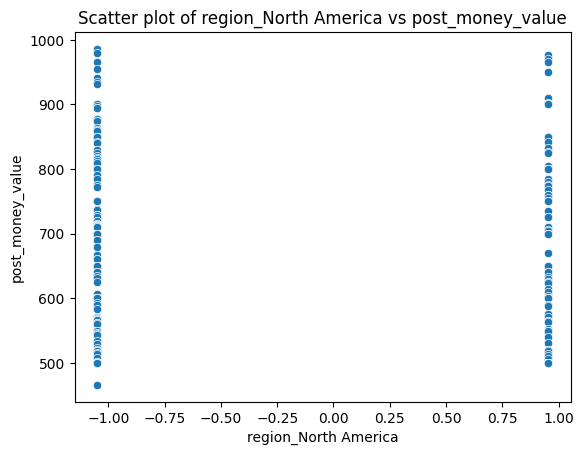

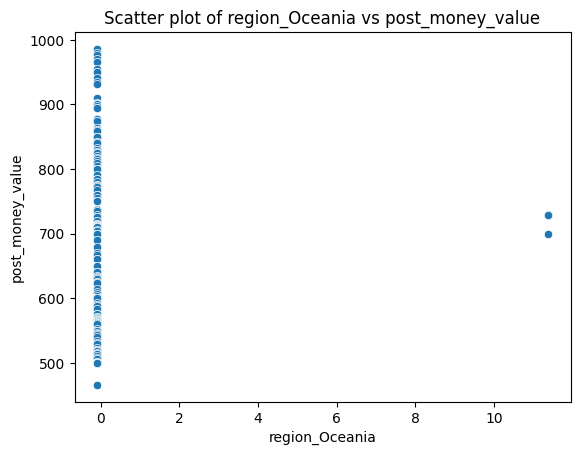

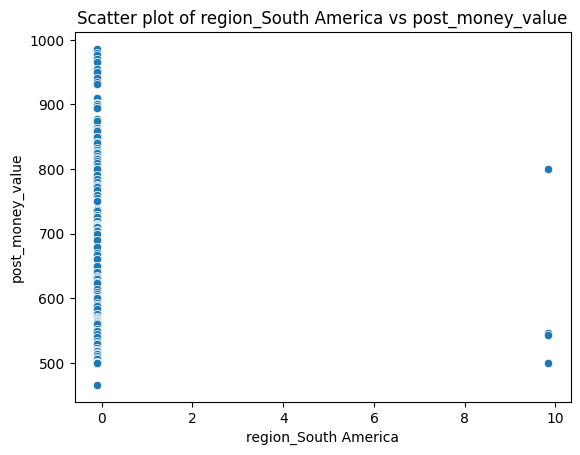

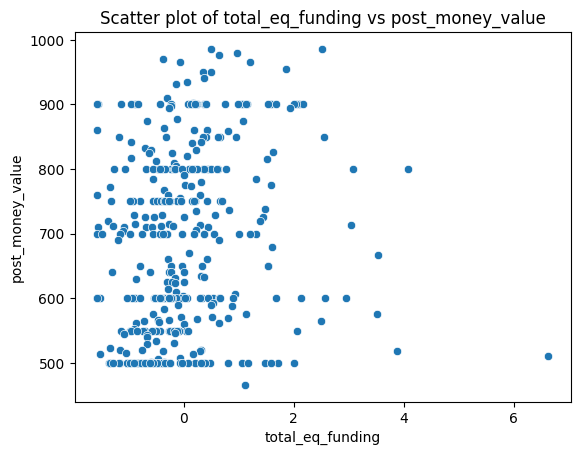

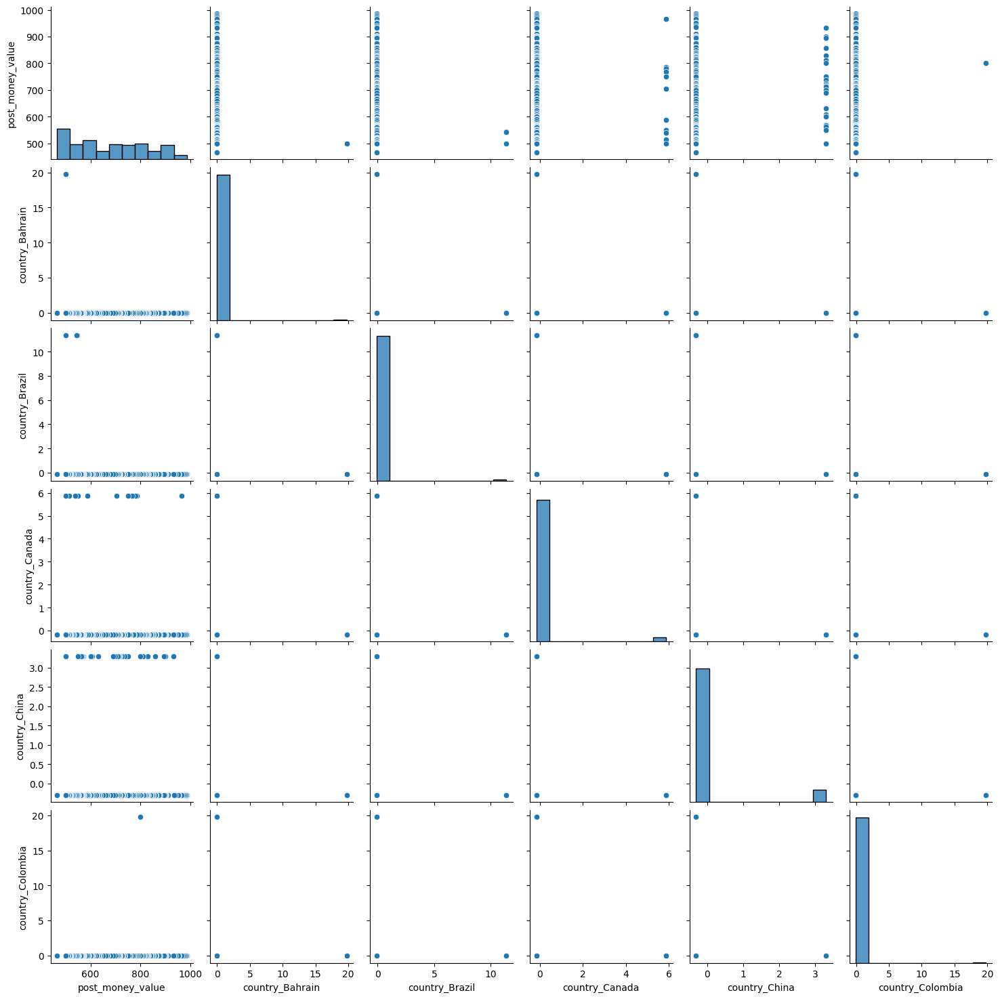

In [57]:
import seaborn as sns
import matplotlib.pyplot as plt

# Scatter plots for numerical features
numerical_features = df.select_dtypes(include=['number']).columns.difference(['post_money_value'])
for feature in numerical_features:
    sns.scatterplot(x=df[feature], y=df['post_money_value'])
    plt.title(f'Scatter plot of {feature} vs post_money_value')
    plt.show()

# Pair plot for a subset of features
sns.pairplot(df[['post_money_value'] + list(numerical_features[:5])])
plt.show()

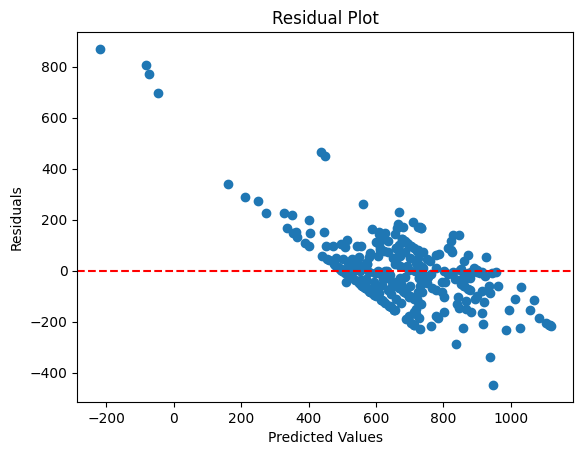

In [59]:
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

# Train a simple linear regression model
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
y_pred = linear_model.predict(X_train)

# Residual plot
residuals = y_train - y_pred
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

In [60]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

# Create polynomial features
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)

# Train a linear model with polynomial features
poly_model = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())
poly_cv_scores = cross_val_score(poly_model, X, y, cv=5, scoring='r2')
print(f'Polynomial Regression Cross-validated R² scores: {poly_cv_scores}')
print(f'Polynomial Regression Mean R² score: {poly_cv_scores.mean()}')

Polynomial Regression Cross-validated R² scores: [-1.04931179e+27 -1.05506072e+27 -1.22179507e+27 -1.38179478e+27
 -8.11887045e+26]
Polynomial Regression Mean R² score: -1.1039698831225453e+27


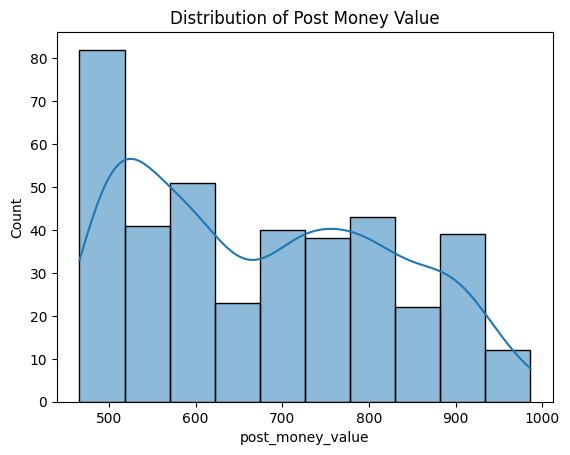

In [65]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Visualize the distribution of the target variable
sns.histplot(df['post_money_value'], kde=True)
plt.title('Distribution of Post Money Value')
plt.show()



Rozkład wartości pieniężnych według inwestorów

In [40]:
import plotly.graph_objects as go
import plotly.express as px

fig = go.Figure()

for investor in df['lead_investors'].unique():
    investor_data = df[df['lead_investors'] == investor]
    fig.add_trace(go.Histogram(
        x=investor_data['post_money_value'],
        name=investor,
        opacity=0.75
    ))

fig.update_layout(
    title='Distribution of Post Money Value by Lead Investors',
    xaxis_title='Post Money Value ($M)',
    yaxis_title='Count',
    barmode='overlay',
    xaxis=dict(tickangle=90),
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=1.05,
        title="Lead Investors",
        traceorder="normal",
        font=dict(size=12),
        bgcolor="LightSteelBlue",
        bordercolor="Black",
        borderwidth=2
    )
)

fig.show()

We can see that SoftBank Vision Fund is quite generous... :)

Średnia wartość firmy według inwestorów

In [41]:
import plotly.express as px

# Grupowanie danych według inwestorów i obliczanie średniej wartości firmy
investor_group = df.groupby('lead_investors').agg({
    'post_money_value': 'mean',
    'company_name': lambda x: ', '.join(x.unique())
}).reset_index()

# Sortowanie danych według wartości firmy
investor_group = investor_group.sort_values(by='post_money_value', ascending=False)

# Tworzenie interaktywnego wykresu słupkowego
fig = px.bar(
    investor_group,
    x='post_money_value',
    y='lead_investors',
    text='company_name',
    orientation='h',
    title='Average Post Money Value by Lead Investors',
    labels={'post_money_value': 'Average Post Money Value ($M)', 'lead_investors': 'Lead Investors'}
)

# Dostosowanie wyglądu wykresu
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(
    height=3500,
    yaxis=dict(tickangle=0, dtick=1),
    margin=dict(l=200, r=20, t=40, b=20)
)

# Wyświetlenie wykresu
fig.show()

The company with the highest average value among investors is Nxtra Data - leading data center company in India.

In [44]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split

# Detect all categorical features in the DataFrame, excluding 'post_money_value' and 'company_name'
categorical_features = df.select_dtypes(include=['object']).columns.difference(['post_money_value', 'company_name'])

# One-hot encode all detected categorical features, dropping the first category to avoid multicollinearity
encoder = OneHotEncoder(sparse_output=False, drop='first')
encoded_features = encoder.fit_transform(df[categorical_features])

# Create a DataFrame with the encoded features
encoded_features_df = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(categorical_features))

# Concatenate the encoded features with the original DataFrame, excluding the original categorical columns
df = pd.concat([df.drop(columns=categorical_features), encoded_features_df], axis=1)

# Ensure the columns 'post_money_value' and 'company_name' exist in the DataFrame
if 'post_money_value' not in df.columns or 'company_name' not in df.columns:
    raise KeyError("Columns 'post_money_value' or 'company_name' not found in DataFrame after encoding.")

# Perform the train-test split
X = df.drop(columns=['post_money_value', 'company_name'])
y = df['post_money_value']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f'Rozmiar X_train: {X_train.shape}')
print(f'Rozmiar X_test: {X_test.shape}')
print(f'Rozmiar y_train: {y_train.shape}')
print(f'Rozmiar y_test: {y_test.shape}')

Rozmiar X_train: (313, 346)
Rozmiar X_test: (79, 346)
Rozmiar y_train: (313,)
Rozmiar y_test: (79,)


## Models:

In [46]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

y_pred_linear = linear_model.predict(X_test)
mse_linear = mean_squared_error(y_test, y_pred_linear)
r2_linear = r2_score(y_test, y_pred_linear)

print(f'Mean Squared Error (Linear Regression): {mse_linear}')
print(f'Rˆ2 score: {r2_linear}')

Mean Squared Error (Linear Regression): 57301.255778992265
Rˆ2 score: -1.650358523235644


In [75]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

random_f_model = RandomForestRegressor(random_state=42)
random_f_model.fit(X_train, y_train)

cross_val_scores = cross_val_score(random_f_model, X, y, cv=5, scoring='r2')

print(f'Cross-validated R² scores (Random Forest Regressor): {cross_val_scores}')
print(f'Mean R² score: {cross_val_scores.mean()}')


Cross-validated R² scores (Random Forest Regressor): [  -38.70362074   -35.04075842    -7.52278156   -31.80910543
 -2416.17180179]
Mean R² score: -505.84961358852223


In [76]:
from sklearn.ensemble import GradientBoostingRegressor

gradient_br_model = GradientBoostingRegressor(random_state=42)
gradient_br_model.fit(X_train, y_train)

cv_scores = cross_val_score(gradient_br_model, X, y, cv=5, scoring='r2')

print(f'Cross-validated R² scores (Gradient Boosting Regressor): {cv_scores}')
print(f'Mean R² score: {cv_scores.mean()}')

Cross-validated R² scores (Gradient Boosting Regressor): [  -37.81837987   -22.90435531    -2.8356628    -27.53874337
 -2811.57579904]
Mean R² score: -580.5345880775993


In [77]:
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import cross_val_score

# Multi-layer Perceptron Regressor
mlp_model = MLPRegressor(random_state=42, max_iter=1000)
mlp_cv_scores = cross_val_score(mlp_model, X_filtered, y_filtered, cv=5, scoring='r2')
print(f'MLP Regressor Cross-validated R² scores: {mlp_cv_scores}')
print(f'MLP Regressor Mean R² score: {mlp_cv_scores.mean()}')

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.



MLP Regressor Cross-validated R² scores: [  -365.34088522   -522.0620684    -186.80118746   -282.62274615
 -11868.74347561]
MLP Regressor Mean R² score: -2645.114072568145


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.



In [49]:
coefficients = pd.DataFrame(linear_model.coef_, X.columns, columns=['Coefficients'])

sorted_coefficients = coefficients.sort_values(by='Coefficients', ascending=False)

print("Top 20 Positive Impact Investors:")
print(sorted_coefficients.head(20))

print("\nTop 20 Negative Impact Investors:")
print(sorted_coefficients.tail(20))

Top 20 Positive Impact Investors:
                                                    Coefficients
lead_investors_Schroder Adveq                         629.094043
lead_investors_Owl Ventures                           607.723408
lead_investors_A91 Partners                           602.514227
lead_investors_Amansa Capital, Jungle Ventures        588.893539
lead_investors_Castrol India                          584.815437
lead_investors_Capital18                              526.910895
lead_investors_Carrefour                              507.608133
lead_investors_Brighton Park Capital                  499.696239
lead_investors_Helios Investment Partners, Taj ...    485.740764
lead_investors_Abstract Ventures, Fasanara Capital    473.985568
lead_investors_Kora                                   463.286779
lead_investors_Lightrock                              459.662663
lead_investors_ADM Ventures                           440.638922
lead_investors_Azimut Holding                         43